### SQLite Geographic Data Visualization

In [22]:
# Import required libraries
import sqlite3
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium import plugins
import plotly.express as px
import random
from datetime import datetime, timedelta
import geopandas as gpd
import json
from shapely.geometry import Point, Polygon

### Create SQLite Database with Geographic Data

In [23]:
# Create a connection to SQLite database
conn = sqlite3.connect('geo_data.db')
cursor = conn.cursor()

# Create tables for storing geographic data
cursor.execute('''
CREATE TABLE IF NOT EXISTS retail_stores (
    id INTEGER PRIMARY KEY,
    name TEXT NOT NULL,
    latitude REAL NOT NULL,
    longitude REAL NOT NULL,
    store_type TEXT NOT NULL,
    square_footage INTEGER,
    opening_date TEXT,
    city TEXT,
    state TEXT,
    zip_code TEXT
)
''')

cursor.execute('''
CREATE TABLE IF NOT EXISTS store_sales (
    id INTEGER PRIMARY KEY,
    store_id INTEGER NOT NULL,
    date TEXT NOT NULL,
    daily_sales REAL NOT NULL,
    transaction_count INTEGER NOT NULL,
    FOREIGN KEY (store_id) REFERENCES retail_stores (id)
)
''')

cursor.execute('''
CREATE TABLE IF NOT EXISTS customer_locations (
    id INTEGER PRIMARY KEY,
    latitude REAL NOT NULL,
    longitude REAL NOT NULL,
    customer_id TEXT NOT NULL,
    age_group TEXT,
    income_level TEXT,
    preferred_store_id INTEGER,
    signup_date TEXT,
    FOREIGN KEY (preferred_store_id) REFERENCES retail_stores (id)
)
''')

# Generate sample retail store data for the United States
# Focusing on major cities
cities = [
    {"name": "New York", "lat": 40.7128, "lon": -74.0060, "state": "NY", "zip": "10001", "count": 12},
    {"name": "Los Angeles", "lat": 34.0522, "lon": -118.2437, "state": "CA", "zip": "90001", "count": 10},
    {"name": "Chicago", "lat": 41.8781, "lon": -87.6298, "state": "IL", "zip": "60601", "count": 8},
    {"name": "Houston", "lat": 29.7604, "lon": -95.3698, "state": "TX", "zip": "77001", "count": 7},
    {"name": "Phoenix", "lat": 33.4484, "lon": -112.0740, "state": "AZ", "zip": "85001", "count": 6},
    {"name": "Philadelphia", "lat": 39.9526, "lon": -75.1652, "state": "PA", "zip": "19101", "count": 5},
    {"name": "San Antonio", "lat": 29.4241, "lon": -98.4936, "state": "TX", "zip": "78201", "count": 4},
    {"name": "San Diego", "lat": 32.7157, "lon": -117.1611, "state": "CA", "zip": "92101", "count": 6},
    {"name": "Dallas", "lat": 32.7767, "lon": -96.7970, "state": "TX", "zip": "75201", "count": 7},
    {"name": "San Francisco", "lat": 37.7749, "lon": -122.4194, "state": "CA", "zip": "94101", "count": 8},
    {"name": "Seattle", "lat": 47.6062, "lon": -122.3321, "state": "WA", "zip": "98101", "count": 6},
    {"name": "Boston", "lat": 42.3601, "lon": -71.0589, "state": "MA", "zip": "02201", "count": 5},
    {"name": "Atlanta", "lat": 33.7490, "lon": -84.3880, "state": "GA", "zip": "30301", "count": 6},
    {"name": "Miami", "lat": 25.7617, "lon": -80.1918, "state": "FL", "zip": "33101", "count": 7},
    {"name": "Denver", "lat": 39.7392, "lon": -104.9903, "state": "CO", "zip": "80201", "count": 5}
]

store_types = ["Flagship", "Mall", "Street", "Outlet", "Express"]
store_id = 1
stores_data = []

for city in cities:
    for i in range(city["count"]):
        # Add some randomness to locations to spread stores around the city
        lat_offset = random.uniform(-0.05, 0.05)
        lon_offset = random.uniform(-0.05, 0.05)

        # Choose a store type (weighted more towards Street and Mall)
        store_type = random.choices(
            store_types,
            weights=[0.1, 0.3, 0.3, 0.2, 0.1],
            k=1
        )[0]

        # Square footage varies by store type
        if store_type == "Flagship":
            sq_footage = random.randint(15000, 25000)
        elif store_type == "Mall":
            sq_footage = random.randint(5000, 12000)
        elif store_type == "Street":
            sq_footage = random.randint(3000, 8000)
        elif store_type == "Outlet":
            sq_footage = random.randint(10000, 20000)
        else:  # Express
            sq_footage = random.randint(1000, 3000)

        # Generate a random opening date in the past 10 years
        days_ago = random.randint(0, 3650)  # Up to 10 years ago
        opening_date = (datetime.now() - timedelta(days=days_ago)).strftime('%Y-%m-%d')

        # Create store name
        store_name = f"RetailCo {city['name']} {store_type} {i+1}"

        stores_data.append((
            store_id,
            store_name,
            city["lat"] + lat_offset,
            city["lon"] + lon_offset,
            store_type,
            sq_footage,
            opening_date,
            city["name"],
            city["state"],
            city["zip"]
        ))

        store_id += 1

# Insert store data
cursor.executemany(
    'INSERT OR REPLACE INTO retail_stores VALUES (?, ?, ?, ?, ?, ?, ?, ?, ?, ?)',
    stores_data
)
conn.commit()

# Generate sample sales data for each store
sales_data = []
sales_id = 1

# Get all store IDs
store_ids = [store[0] for store in stores_data]

# Generate 90 days of sales data
start_date = datetime.now() - timedelta(days=90)
for day in range(90):
    current_date = (start_date + timedelta(days=day)).strftime('%Y-%m-%d')

    for store_id in store_ids:
        # Find store info (type and square footage)
        store_info = next((s for s in stores_data if s[0] == store_id), None)
        store_type = store_info[4]
        sq_footage = store_info[5]

        # Base sales depends on store type and size
        if store_type == "Flagship":
            base_sales = 25000
        elif store_type == "Mall":
            base_sales = 15000
        elif store_type == "Street":
            base_sales = 10000
        elif store_type == "Outlet":
            base_sales = 20000
        else:  # Express
            base_sales = 5000

        # Adjust by square footage
        size_factor = sq_footage / 10000

        # Add day of week effect (weekends have more sales)
        day_of_week = (day % 7)  # 0 = Monday, 6 = Sunday
        if day_of_week == 5:  # Saturday
            day_factor = 1.4
        elif day_of_week == 6:  # Sunday
            day_factor = 1.2
        else:
            day_factor = 0.9

        # Add some randomness
        random_factor = random.uniform(0.8, 1.2)

        # Calculate daily sales
        daily_sales = base_sales * size_factor * day_factor * random_factor

        # Transaction count (roughly $50 per transaction on average)
        transaction_count = int(daily_sales / random.uniform(40, 60))

        sales_data.append((
            sales_id,
            store_id,
            current_date,
            daily_sales,
            transaction_count
        ))

        sales_id += 1

# Insert sales data in batches
conn.execute('BEGIN TRANSACTION')
for i in range(0, len(sales_data), 1000):
    batch = sales_data[i:i+1000]
    cursor.executemany(
        'INSERT OR REPLACE INTO store_sales (id, store_id, date, daily_sales, transaction_count) VALUES (?, ?, ?, ?, ?)',
        batch
    )
conn.execute('COMMIT')

# Generate customer location data
customer_data = []
customer_id = 1
num_customers = 5000

# Age groups and income levels
age_groups = ["18-24", "25-34", "35-44", "45-54", "55-64", "65+"]
income_levels = ["Low", "Medium", "High", "Very High"]

for _ in range(num_customers):
    # Pick a random store as their preferred store
    store = random.choice(stores_data)
    store_id = store[0]
    store_lat = store[2]
    store_lon = store[3]

    # Customer lives within ~10 miles (0.15 degrees) of their preferred store
    customer_lat = store_lat + random.uniform(-0.15, 0.15)
    customer_lon = store_lon + random.uniform(-0.15, 0.15)

    # Random age group and income level
    age_group = random.choice(age_groups)
    income_level = random.choice(income_levels)

    # Random signup date in past 5 years
    days_ago = random.randint(0, 1825)  # Up to 5 years ago
    signup_date = (datetime.now() - timedelta(days=days_ago)).strftime('%Y-%m-%d')

    customer_data.append((
        customer_id,
        customer_lat,
        customer_lon,
        f"CUST-{customer_id:06d}",
        age_group,
        income_level,
        store_id,
        signup_date
    ))

    customer_id += 1

# Insert customer data
cursor.executemany(
    'INSERT OR REPLACE INTO customer_locations VALUES (?, ?, ?, ?, ?, ?, ?, ?)',
    customer_data
)
conn.commit()

print("Database populated with sample geographic data")

Database populated with sample geographic data


### Basic Map Visualizatio

In [24]:
# Query store data
query = """
SELECT id, name, latitude, longitude, store_type, square_footage, city, state
FROM retail_stores
"""
df_stores = pd.read_sql_query(query, conn)

# Create a base map centered on the United States
map_center = [39.50, -98.35]  # Approximate center of the US
store_map = folium.Map(location=map_center, zoom_start=4, tiles='CartoDB positron')

# Add store markers to the map
for idx, row in df_stores.iterrows():
    # Define color based on store type
    if row['store_type'] == 'Flagship':
        color = 'red'
        size = 15
    elif row['store_type'] == 'Mall':
        color = 'blue'
        size = 10
    elif row['store_type'] == 'Street':
        color = 'green'
        size = 8
    elif row['store_type'] == 'Outlet':
        color = 'purple'
        size = 12
    else:  # Express
        color = 'orange'
        size = 6

    # Create popup text
    popup_text = f"""
    <b>{row['name']}</b><br>
    Type: {row['store_type']}<br>
    Size: {row['square_footage']} sq ft<br>
    Location: {row['city']}, {row['state']}
    """

    # Add marker to map
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=size,
        color=color,
        fill=True,
        fill_opacity=0.7,
        popup=folium.Popup(popup_text, max_width=200)
    ).add_to(store_map)

# Add layer control and legend
folium.LayerControl().add_to(store_map)

# Create a legend as HTML
legend_html = '''
<div style="position: fixed;
     bottom: 50px; right: 50px; width: 150px; height: 120px;
     border:2px solid grey; z-index:9999; font-size:12px;
     background-color:white; padding: 10px;
     ">
     <b>Store Types</b><br>
     <i class="fa fa-circle" style="color:red"></i> Flagship<br>
     <i class="fa fa-circle" style="color:blue"></i> Mall<br>
     <i class="fa fa-circle" style="color:green"></i> Street<br>
     <i class="fa fa-circle" style="color:purple"></i> Outlet<br>
     <i class="fa fa-circle" style="color:orange"></i> Express<br>
</div>
'''
store_map.get_root().html.add_child(folium.Element(legend_html))

# Save and display the map
store_map.save('retail_stores_map.html')
store_map

#### Clustered Customer Map

In [25]:
# Query customer data
query = """
SELECT cl.id, cl.latitude, cl.longitude, cl.age_group, cl.income_level,
       rs.name as preferred_store, rs.store_type
FROM customer_locations cl
JOIN retail_stores rs ON cl.preferred_store_id = rs.id
"""
df_customers = pd.read_sql_query(query, conn)

# Create a base map
customer_map = folium.Map(location=map_center, zoom_start=4, tiles='CartoDB positron')

# Create a marker cluster
marker_cluster = plugins.MarkerCluster().add_to(customer_map)

# Add customer markers to the cluster
for idx, row in df_customers.iterrows():
    # Define color based on income level
    if row['income_level'] == 'Low':
        color = 'lightgreen'
    elif row['income_level'] == 'Medium':
        color = 'green'
    elif row['income_level'] == 'High':
        color = 'darkgreen'
    else:  # Very High
        color = 'black'

    # Create popup text
    popup_text = f"""
    <b>Customer {row['id']}</b><br>
    Age Group: {row['age_group']}<br>
    Income Level: {row['income_level']}<br>
    Preferred Store: {row['preferred_store']}
    """

    # Add marker to the cluster
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=2,
        color=color,
        fill=True,
        fill_opacity=0.5,
        popup=popup_text
    ).add_to(marker_cluster)

# Save and display the map
customer_map.save('customer_clusters_map.html')
customer_map

Advanced Geographic Visualizations

In [30]:
# Query sales data by store
query = """
SELECT rs.id, rs.name, rs.latitude, rs.longitude, rs.store_type, rs.city, rs.state,
       SUM(ss.daily_sales) as total_sales,
       AVG(ss.daily_sales) as avg_daily_sales,
       COUNT(ss.id) as days_open
FROM retail_stores rs
JOIN store_sales ss ON rs.id = ss.store_id
GROUP BY rs.id
"""
df_store_sales = pd.read_sql_query(query, conn)

# Create a new map
heatmap = folium.Map(location=map_center, zoom_start=4, tiles='CartoDB dark_matter')

# Prepare heatmap data
heat_data = [[row['latitude'], row['longitude'], row['total_sales']/1000000]
             for idx, row in df_store_sales.iterrows()]



In [28]:
# Add heatmap to the map
plugins.HeatMap(heat_data, radius=20, gradient={0.4: 'blue', 0.65: 'lime', 1.0: 'red'}).add_to(heatmap) # Changed the key '1' to '1.0' to make sure all keys are floats

Choropleth Map of Sales by State

In [31]:
# Query total sales by state
query = """
SELECT rs.state,
       SUM(ss.daily_sales) as total_sales,
       COUNT(DISTINCT rs.id) as store_count
FROM retail_stores rs
JOIN store_sales ss ON rs.id = ss.store_id
GROUP BY rs.state
"""
df_state_sales = pd.read_sql_query(query, conn)

# Calculate sales per store
df_state_sales['sales_per_store'] = df_state_sales['total_sales'] / df_state_sales['store_count']

# Load US state GeoJSON
import requests
url = "https://raw.githubusercontent.com/python-visualization/folium/master/examples/data/us-states.json"
us_states = requests.get(url).json()

# Create a choropleth map
choropleth = folium.Map(location=map_center, zoom_start=4)

folium.Choropleth(
    geo_data=us_states,
    name='choropleth',
    data=df_state_sales,
    columns=['state', 'sales_per_store'],
    key_on='feature.id',
    fill_color='YlGnBu',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Average Sales per Store ($)'
).add_to(choropleth)

folium.LayerControl().add_to(choropleth)

# Add hover functionality
style_function = lambda x: {'fillColor': '#ffffff',
                            'color':'#000000',
                            'fillOpacity': 0.1,
                            'weight': 0.1}
highlight_function = lambda x: {'fillColor': '#000000',
                                'color':'#000000',
                                'fillOpacity': 0.50,
                                'weight': 0.1}

# Convert to GeoJSON and add layer
state_data = folium.features.GeoJson(
    us_states,
    style_function=style_function,
    control=False,
    highlight_function=highlight_function,
    tooltip=folium.features.GeoJsonTooltip(
        fields=['name'],
        aliases=['State:'],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;")
    )
)
choropleth.add_child(state_data)
choropleth.keep_in_front(state_data)

# Save and display the map
choropleth.save('state_sales_choropleth.html')
choropleth

Customer Distribution Analysis

In [32]:
# Query customer distribution
query = """
SELECT rs.id, rs.name, rs.latitude, rs.longitude, rs.store_type, rs.city, rs.state,
       COUNT(cl.id) as customer_count
FROM retail_stores rs
JOIN customer_locations cl ON rs.id = cl.preferred_store_id
GROUP BY rs.id
"""
df_customer_distribution = pd.read_sql_query(query, conn)

# Create Plotly bubble map
fig = px.scatter_geo(
    df_customer_distribution,
    lat='latitude',
    lon='longitude',
    size='customer_count',
    color='store_type',
    hover_name='name',
    hover_data=['city', 'state', 'customer_count'],
    scope='usa',
    title='Customer Distribution by Store'
)

fig.update_layout(legend_title_text='Store Type')
fig.show()

# Age group analysis with Plotly
query = """
SELECT rs.city, cl.age_group, COUNT(cl.id) as customer_count
FROM customer_locations cl
JOIN retail_stores rs ON cl.preferred_store_id = rs.id
GROUP BY rs.city, cl.age_group
ORDER BY rs.city, cl.age_group
"""
df_age_groups = pd.read_sql_query(query, conn)

# Create stacked bar chart
fig = px.bar(
    df_age_groups,
    x='city',
    y='customer_count',
    color='age_group',
    title='Customer Age Distribution by City',
    labels={'customer_count': 'Number of Customers', 'city': 'City', 'age_group': 'Age Group'}
)
fig.show()

#### Store Performance Geographical Analysis

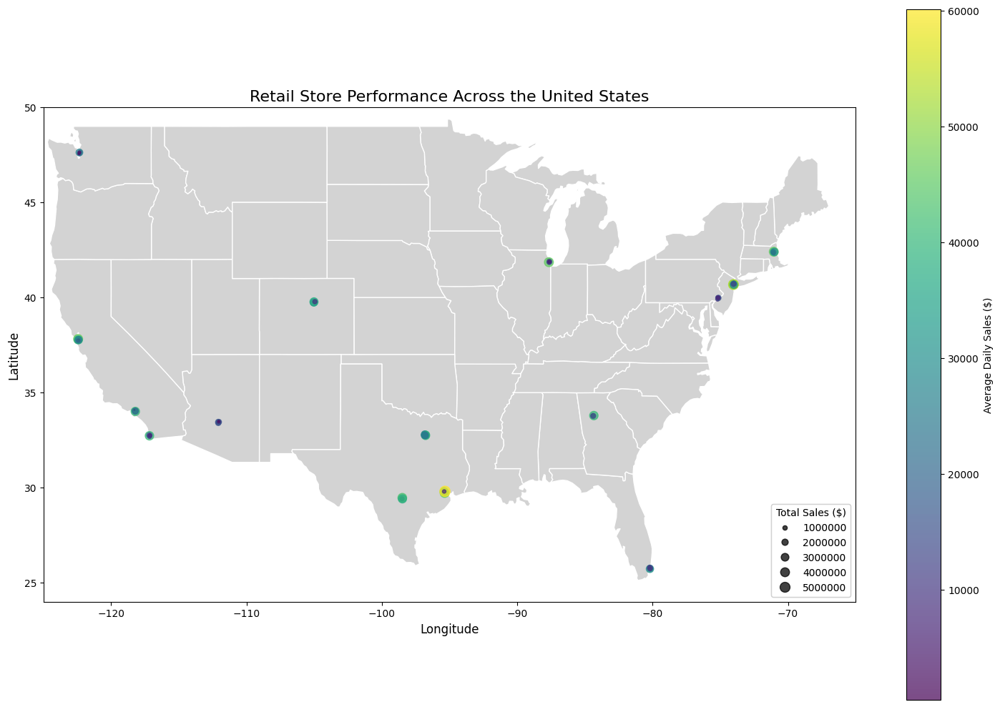

In [34]:
# Create a GeoDataFrame for advanced spatial analysis
gdf_stores = gpd.GeoDataFrame(
    df_store_sales,
    geometry=gpd.points_from_xy(df_store_sales.longitude, df_store_sales.latitude),
    crs="EPSG:4326"
)

# Create a custom colormap for sales
max_sales = df_store_sales['total_sales'].max()
min_sales = df_store_sales['total_sales'].min()

# Matplotlib visualization of store performance
fig, ax = plt.subplots(figsize=(15, 10))

# Download and read US states shapefile
#Original: us_states = gpd.read_file('https://raw.githubusercontent.com/OpenDataDE/State-zip-code-GeoJSON/master/gz_2010_us_040_00_500k.json')
#Corrected URL to US States GeoJSON file:
us_states = gpd.read_file('https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json')
us_states.plot(ax=ax, color='lightgray', edgecolor='white')

# Plot stores with size and color based on sales
scatter = ax.scatter(
    df_store_sales['longitude'],
    df_store_sales['latitude'],
    s=df_store_sales['total_sales']/50000,  # Size based on sales
    c=df_store_sales['avg_daily_sales'],    # Color based on average daily sales
    cmap='viridis',
    alpha=0.7
)

# Create store type legends
legend1 = ax.legend(
    *scatter.legend_elements(prop="sizes", num=5, func=lambda x: x*50000, fmt="{x:.0f}"),
    loc="lower right",
    title="Total Sales ($)"
)
ax.add_artist(legend1)

# Add color bar for average daily sales
cbar = plt.colorbar(scatter, ax=ax)
cbar.set_label('Average Daily Sales ($)')

# Set plot title and labels
ax.set_title('Retail Store Performance Across the United States', fontsize=16)
ax.set_xlabel('Longitude', fontsize=12)
ax.set_ylabel('Latitude', fontsize=12)

# Improve aesthetics
ax.set_xlim(-125, -65)  # Continental US longitude range
ax.set_ylim(24, 50)     # Continental US latitude range
ax.grid(False)

plt.tight_layout()
plt.savefig('store_performance_map.png', dpi=300)
plt.show()